<a href="https://colab.research.google.com/github/NimaMeghdadi/Yolov5-footballPlayerDetection-torch/blob/main/football_player_detector_yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Setup**





In [ ]:
!git clone https://github.com/ultralytics/yolov5
!pip install -U -r yolov5/requirements.txt  # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 14862, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 14862 (delta 0), reused 1 (delta 0), pack-reused 14858
Receiving objects: 100% (14862/14862), 13.87 MiB | 23.71 MiB/s, done.
Resolving deltas: 100% (10229/10229), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 13.9 MB/s 
     |████████████████████████████████| 761 kB 60.3 MB/s 
     |████████████████████████████████| 9.4 MB 63.1 MB/s 
     |████████████████████████████████| 17.3 MB 56.6 MB/s 
     |████████████████████████████████| 3.2 MB 49.1 MB/s 
     |████████████████████████████████| 280 kB 77.3 MB/s 
     |████████████████████████████████| 62 kB 1.9 MB/s 
     |████████████████████████████████| 33.8 MB 98.5 MB/s 
     |██████████████████████████████  | 834.1 MB 1.2 MB/s eta 0:00:46tcmalloc: large alloc 11474

In [ ]:
!pip install torch==1.10.1 torchvision==0.11.3 torchaudio===0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |██████████████████████████▊     | 834.1 MB 1.4 MB/s eta 0:01:56tcmalloc: large alloc 1147494400 bytes == 0x3a7f8000 @  0x7f72f9c79615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x4fd8b5 0x4997c7 0x4fd8b5 0x49abe4 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x5d8868 0x5da092 0x587116 0x5d8d8c 0x55dc1e 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4990ca 0x5d8868 0x4997a2 0x4fd8b5 0x49abe4
     |████████████████████████████████| 997.4 MB 1.1 MB/s eta 0:00:01tcmalloc: large alloc 1246765056 bytes == 0xba582000 @  0x7f72f9c79615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x55cd91 0x5d8941 0x4997a2 0x5d8868 0x4997a2 0x55cd91 0x5d8941 0x49abe4 0x4fd8b5 0x49abe4 0x55cd91 0x5d8941 0x4fe318
     |██████

In [ ]:
%cd /content/yolov5
!ls

/content/yolov5
benchmarks.py	 data	     LICENSE	      requirements.txt	tutorial.ipynb
CITATION.cff	 detect.py   models	      segment		utils
classify	 export.py   README.md	      setup.cfg		val.py
CONTRIBUTING.md  hubconf.py  README.zh-CN.md  train.py


# **GPU information**

In [ ]:
import torch
from IPython.display import Image  # for displaying images
# from utils.google_utils import gdrive_download


print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.13.1+cu117 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


# **Mount google drive**

In [ ]:
from google.colab import drive  # for downloading models/datasets
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/Deep project

/content/drive/MyDrive/Colab Notebooks/Deep project


In [ ]:
!ls

1min_video.mp4
dataset.zip
data.yaml
football_player_detector_yolov5.ipynb
result
resume
tensorflow_yolov5_football_player_detector.ipynb
torch_football_detector_yolov7.ipynb
Trainin_yolo_ta_sh.ipynb


# **Download data set**

In [ ]:
!unzip "/content/drive/MyDrive/Colab Notebooks/Deep project/dataset.zip" -d "/content"

Archive:  /content/drive/MyDrive/Colab Notebooks/Deep project/dataset.zip
   creating: /content/test/images/
  inflating: /content/test/images/frame1618.jpg  
  inflating: /content/test/images/frame1620.jpg  
  inflating: /content/test/images/frame1621.jpg  
  inflating: /content/test/images/frame1622.jpg  
  inflating: /content/test/images/frame1623.jpg  
  inflating: /content/test/images/frame1624.jpg  
  inflating: /content/test/images/frame1641.jpg  
  inflating: /content/test/images/frame1642.jpg  
  inflating: /content/test/images/frame1643.jpg  
  inflating: /content/test/images/frame1644.jpg  
  inflating: /content/test/images/frame1645.jpg  
  inflating: /content/test/images/frame1646.jpg  
  inflating: /content/test/images/frame1647.jpg  
  inflating: /content/test/images/frame1648.jpg  
  inflating: /content/test/images/frame1649.jpg  
  inflating: /content/test/images/frame1650.jpg  
  inflating: /content/test/images/frame1651.jpg  
  inflating: /content/test/images/frame16

# **looking for data.yaml**

In [ ]:
# %cd /content/yolov5/data
%cd /content/drive/MyDrive/Colab Notebooks/Deep project
%cat data.yaml

/content/drive/MyDrive/Colab Notebooks/Deep project
train: ../train/images
val: ../valid/images

nc: 4
names: ['Team 1','Team 2','Referee','Ball']

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [ ]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))

Number of Classes are 4, whose labels are ['Team 1', 'Team 2', 'Referee', 'Ball'] for this Object Detection project


In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

# **Creating Model**

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


# **Start Train**

In [ ]:
%cd /content/yolov5
!python train.py --img 720 --batch 50 --epochs 100 --data '/content/drive/MyDrive/Colab Notebooks/Deep project/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --cache --project '/content/drive/MyDrive/Colab Notebooks/Deep project/resume'

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/drive/MyDrive/Colab Notebooks/Deep project/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=50, imgsz=720, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../content/drive/MyDrive/Colab Notebooks/Deep project, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-47-g2370a55 Python-3.8.16 torch-1.13.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, 

# **IF connection lost**

In [ ]:
!python train.py --resume '/content/drive/My Drive/yolov5-checkpoints/exp2/weights/best.pt'

# **continue train**

In [ ]:
%cd /content/yolov5
!python train.py --img 720 --batch 50 --epochs 100 --data '/content/drive/MyDrive/Colab Notebooks/Deep project/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '/content/drive/My Drive/yolov5-checkpoints/exp2/weights/best.pt' --cache --project '/content/drive/MyDrive/Colab Notebooks/Deep project/resume'

# **for augmentation**
  [Test-Time Augmentation (TTA)](https://docs.ultralytics.com/tutorials/test-time-augmentation/)
  
  [Transfer Learning with Frozen Layers](https://docs.ultralytics.com/tutorials/transfer-learning-froze-layers/)

In [ ]:
!python val.py --img 720 --batch 50 --epochs 100 --augment --data '/content/drive/MyDrive/Colab Notebooks/Deep project/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '/content/drive/My Drive/yolov5-checkpoints/exp2/weights/best.pt' --cache --project '/content/drive/MyDrive/Colab Notebooks/Deep project/resume'

# **See chart of improvement in trainig**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Colab Notebooks/Deep project/resume'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

GROUND TRUTH TRAINING DATA:


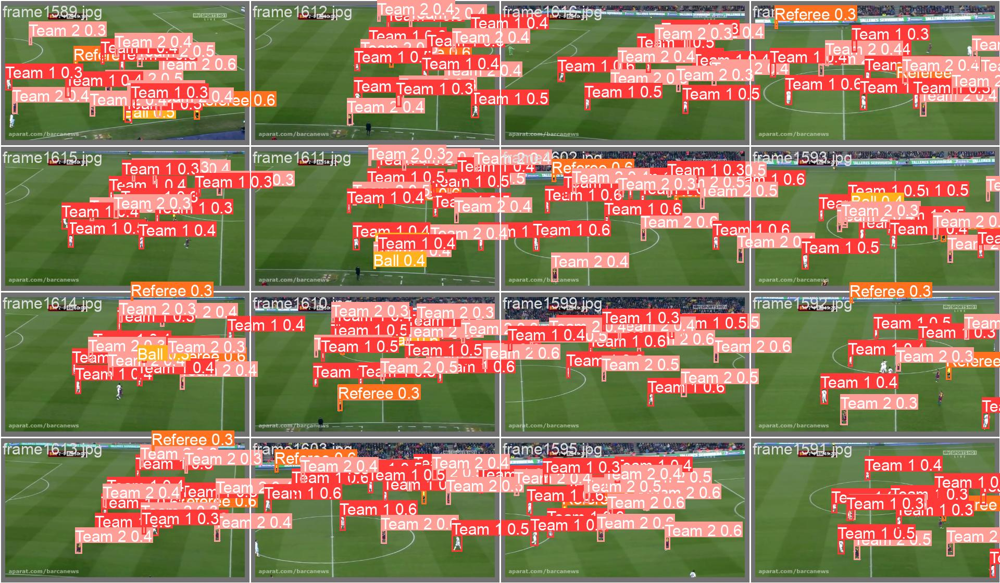

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/drive/MyDrive/Colab Notebooks/Deep project/resume/exp6/val_batch0_pred.jpg', width=900)

In [ ]:
%cd /content/yolov5/
!python detect.py --weights '/content/content/drive/MyDrive/Colab Notebooks/Deep project/exp/weights/best.pt' --img 720 --conf 0.4 --source '/content/drive/MyDrive/Colab Notebooks/Deep project/1min_video.mp4'

/content/yolov5
detect: weights=['/content/content/drive/MyDrive/Colab Notebooks/Deep project/exp/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/Deep project/1min_video.mp4, data=data/coco128.yaml, imgsz=[720, 720], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-47-g2370a55 Python-3.8.16 torch-1.13.1+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [720, 720] must be multiple of max stride 32, updating to [736, 736]
video 1/1 (1/1051) /content/drive/MyDrive/Colab Notebooks/Deep project/1min_video.mp4: 416x736 6 Team 1s, 4 Team 2s, 1 Referee, 11.9ms
v